# Estudio retraso variables

En este notebook se llevará a cabo el estudio del retraso de las distintas señales de la poligrafía nocturna. Para llevar a cabo dicho estudio, es necesario haber ejecutado previamente el programa *calculo_correlacion_retraso_variables.py*

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import pickle
import utils
import os
import math

import matplotlib.pyplot as plt
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=["#CF9962", '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']) 
plt.rcParams["patch.force_edgecolor"] = True
import utils
%load_ext autoreload
%autoreload 2

## Configuración de variables

En esta sección, se debe indicar la ruta donde se encuentra la información del paciente serializada. De igual forma, se debe indicar el threshold a partir del que realizaremos la división de los pacientes en dos conjuntos, para generar los mapas de correlación en función del nivel de IAH.

In [4]:
def normalize(s):
    replacements = (
        ("á", "a"),
        ("é", "e"),
        ("í", "i"),
        ("ó", "o"),
        ("ú", "u"),
    )
    for a, b in replacements:
        s = s.replace(a, b).replace(a.upper(), b.upper())
    return s

In [5]:
# Directorio que contiene los ficheros .csv que se van a analizar
dataset_dir = "../data/pacientes/big-data"
pickle_dir = os.path.join(dataset_dir, "pickle")

In [6]:
pacientes = []
for f in tqdm(os.listdir(pickle_dir)):
    if os.path.splitext(f)[1] == ".pickle":
        with open(os.path.join(pickle_dir, f), "rb") as handle:
             paciente = pickle.load(handle)
             paciente.clean_memory()
             # Liberamos la memoria porque sino nos quedamos sin RAM
        pacientes.append(paciente)

100%|██████████| 55/55 [00:24<00:00,  2.26it/s]


In [7]:
# Ordenamos los pacientes por indice de IAH de mayor a menor
pacientes_sorted = sorted(pacientes, key= lambda paciente: paciente.iah, reverse=True)

In [8]:
def create_scaterr_graph(variable: str, pacientes: list, key_value: str, abs_values: bool = False, savefig=True):
    """
    Debemos indicar si en el eje y queremos mostrar la correlacion, o el retraso.
    Los valores posibles son peak_corr o offset_peak_corr
    """
    if variable not in ["peak_corr", "offset_peak_corr"]:
        print("Solo se acepta la peak_corr o offset_peak_corr como parametro")
        return

    plt.figure(figsize=(15, 10))
    plt.xlabel("Señal")

    senial_estudiada = key_value.split('-')[2]

    if variable == "peak_corr":
        plt.ylabel("Coeficiente correlacion")
        title = "Coeficiente correlacion "
        title += "(valor absoluto) " if abs_values else ""
        title += f"vs {senial_estudiada}"
        plt.title(title)

    else:
        plt.ylabel("Retraso señal (segundos)")
        title = f"Retraso señal (segundos) vs {senial_estudiada}"
        plt.title(title)


    # Obtenemos los nombres de las variables
    variables = pacientes_sorted[0].variables_significativas
    x_ticks = range(0, len(variables))
    plt.xticks(x_ticks, variables, rotation=45)

    # Tenemos tantos colores como pacientes
    colors = [c["color"] for c in list(plt.rcParams['axes.prop_cycle'])] + ['darkgray', 'palegreen', 'coral']

    legend_elements = []
    for j, paciente_actual in enumerate(pacientes):
        df_estadisticas = paciente_actual.sincronizacion_señales[key_value]
        for i, row_name in enumerate(df_estadisticas.index):

            # El valor del eje y lo ponemos en valor absoluto si estamos estudiando la correlacion
            if abs_values: y = np.abs(df_estadisticas.iloc[i][variable]) if variable == "peak_corr" else df_estadisticas.iloc[i][variable]
            else: y = df_estadisticas.iloc[i][variable]

            tmp = plt.scatter(i, y, s=paciente_actual.iah*40, c=colors[j%len(colors)], alpha=0.5)
        """
        legend_elements.append(tmp) # Voy almacenando para luego poder etiquetar
        """
    """
    legend_names = [f"P{i+1}-IAH={paciente.iah:.2f}" for i, paciente in enumerate(pacientes_sorted)]
    lgnd = plt.legend(legend_elements, legend_names, scatterpoints=1, prop={'size': 14})

    # En la leyenda queremos que todos los puntos tengan el mismo grosor
    for element_in_legend in lgnd.legendHandles: 
        element_in_legend._sizes = [75]
    """
    if savefig: plt.savefig(f"{title.replace(' ', '_').lower()}.pdf", transparent=True, bbox_inches = 'tight',pad_inches = 0.025)
    
    plt.show()

In [9]:
key_values = set()
for paciente in pacientes:
    key_values.update(paciente.sincronizacion_señales.keys())
    # Corresponde con las estadísticas que se han recopilado
key_values

{'signal-vs-abdomen-prior=60s-post=60s',
 'signal-vs-activity-prior=60s-post=60s',
 'signal-vs-audio_volume_db-prior=60s-post=60s',
 'signal-vs-flow-prior=60s-post=60s',
 'signal-vs-presion_nasal-prior=60s-post=60s',
 'signal-vs-pulso-prior=60s-post=60s',
 'signal-vs-snore-prior=60s-post=60s',
 'signal-vs-spo2-prior=60s-post=10s'}

In [31]:
signals = pacientes_sorted[0].variables_significativas
signals

['abdomen',
 'activity',
 'audio_volume_db',
 'flow',
 'presion_nasal',
 'pulso',
 'spo2',
 'snore']

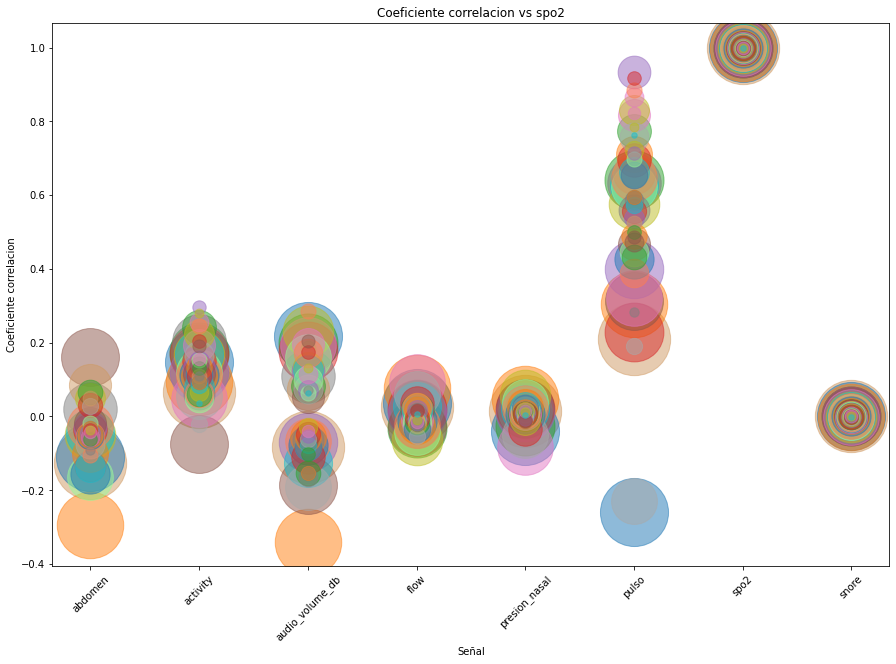

In [11]:
for key_value in key_values:
    create_scaterr_graph(variable="peak_corr", pacientes=pacientes_sorted, key_value="signal-vs-spo2-prior=60s-post=10s", savefig=True)
    break

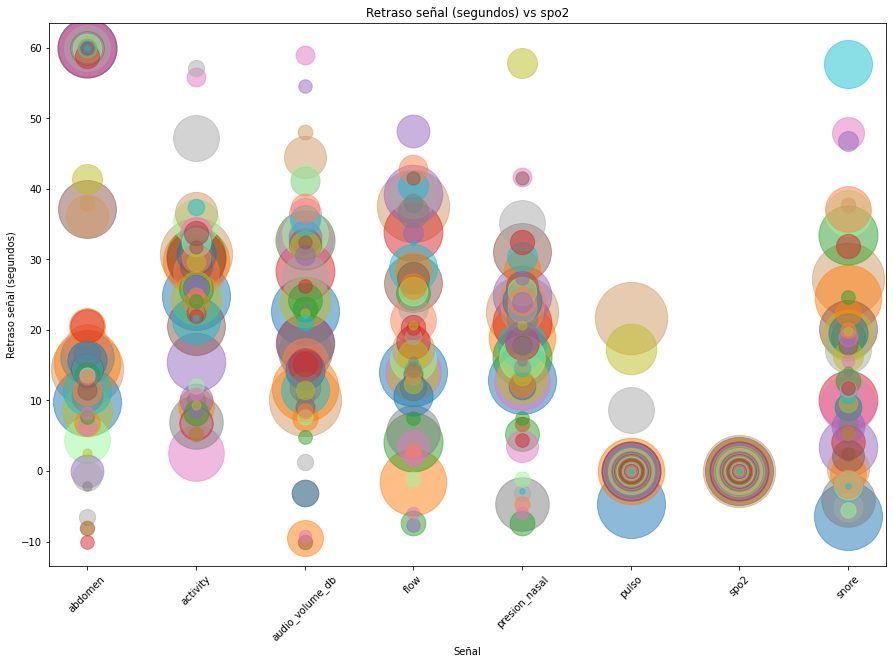

In [12]:
for key_value in key_values:
    create_scaterr_graph(variable="offset_peak_corr", pacientes=pacientes_sorted, key_value="signal-vs-spo2-prior=60s-post=10s", savefig=True)
    break

In [94]:
def plot_informacion_histograma(iah_vs_spo2, main_signal, metric="peak_corr", savefig=False, xlim=None):
    for signal, curr_iah_vs_spo2 in zip(signals, iah_vs_spo2):
        if signal == main_signal:
            continue

        plt.figure(figsize=(7, 5))
        correlation_spo2_df = pd.DataFrame(curr_iah_vs_spo2, columns=["IAH", "Corr"])
        sns.histplot(correlation_spo2_df,y="IAH", x="Corr", bins=12, shrink=1, cbar=True)
        xlabel = "Correlación" if metric=="peak_corr" else "Retraso (s)"
        ylabel = "IAH"
        title = f"{signal} vs {main_signal}".capitalize()
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.title(title)
        if xlim is not None: plt.xlim(xlim)

        x_ticks = plt.xticks()[0]

        
        x_ticks_labels = [None]+[str(round(i, 4)).rstrip('0').rstrip('.') for i in x_ticks[1:-1]]+[None]
        
        # Los numeros que tienen muchos decimales, los pongo de 2 en 2 para que no ocupen todo el eje
        if '.' in x_ticks_labels[1] and len(str(x_ticks_labels[1]).split('.')[1])>3:
            x_ticks_labels = x_ticks_labels[::2]
            x_ticks = x_ticks[::2]

        plt.xticks(x_ticks, x_ticks_labels)

        #plt.locator_params(axis='x', nbins=4)
        pdf_title = f"{xlabel} {signal} vs {main_signal}"
        if savefig: plt.savefig(f"{normalize(pdf_title.replace(' ', '_').lower())}.pdf", transparent=True, bbox_inches = 'tight',pad_inches = 0.025)
        plt.show()

In [96]:
def preparar_grafico_histograma(descripcion, metric="peak_corr"):
    if metric not in ["peak_corr", "offset_peak_corr"]:
        print(f"Opción no válida. La opción tiene que ser peak_corr o offset_peak_corr")
        return None

    #signals = pacientes_sorted[0].variables_significativas
    signal_vs_signal = [None]*len(signals)
    for i, signal in enumerate(signals):
        current = [(paciente.iah, paciente.sincronizacion_señales[descripcion][metric][signal]) for paciente in pacientes_sorted]
        current = [(i, j) for i, j in current if math.isnan(i) is False and math.isnan(j) is False]
        signal_vs_signal[i] = current
    
    return signal_vs_signal

In [79]:
key_values

{'signal-vs-abdomen-prior=60s-post=60s',
 'signal-vs-activity-prior=60s-post=60s',
 'signal-vs-audio_volume_db-prior=60s-post=60s',
 'signal-vs-flow-prior=60s-post=60s',
 'signal-vs-presion_nasal-prior=60s-post=60s',
 'signal-vs-pulso-prior=60s-post=60s',
 'signal-vs-snore-prior=60s-post=60s',
 'signal-vs-spo2-prior=60s-post=10s'}

In [80]:
# Lista con todas las señales con las que se ha calculado el retraso
signal_list = [descripcion.split('-')[2] for descripcion in key_values]

In [81]:
key_values - {'signal-vs-spo2-prior=60s-post=10s'}

{'signal-vs-abdomen-prior=60s-post=60s',
 'signal-vs-activity-prior=60s-post=60s',
 'signal-vs-audio_volume_db-prior=60s-post=60s',
 'signal-vs-flow-prior=60s-post=60s',
 'signal-vs-presion_nasal-prior=60s-post=60s',
 'signal-vs-pulso-prior=60s-post=60s',
 'signal-vs-snore-prior=60s-post=60s'}

In [103]:
utils.set_font_size(plt, 15)

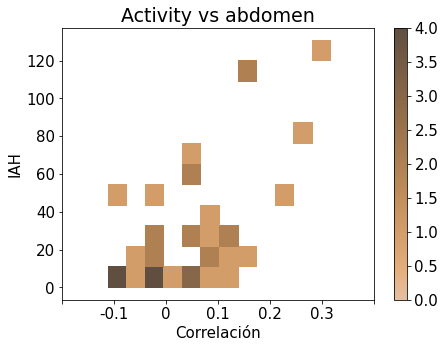

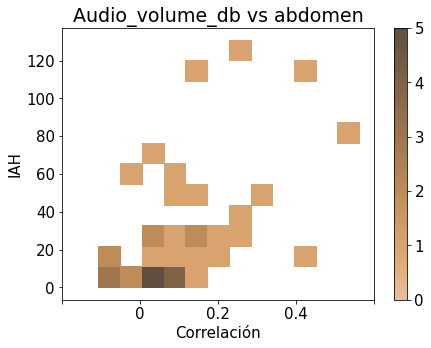

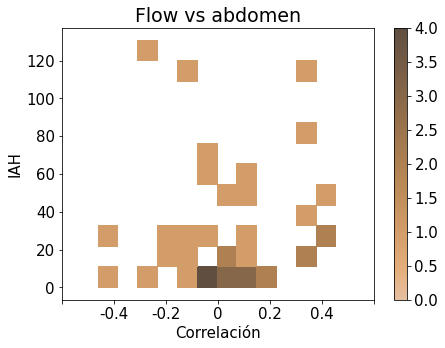

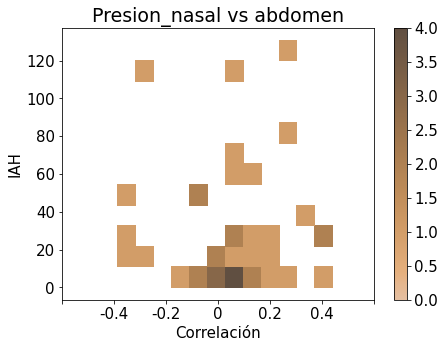

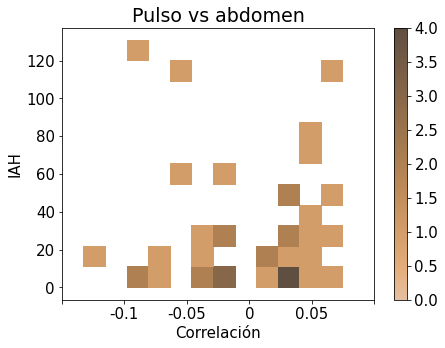

...

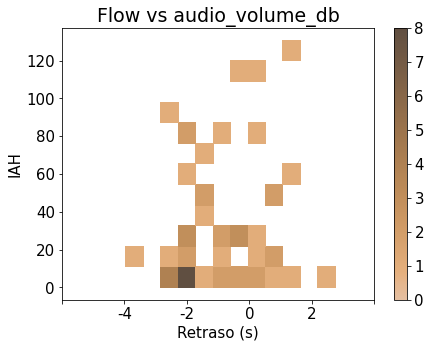

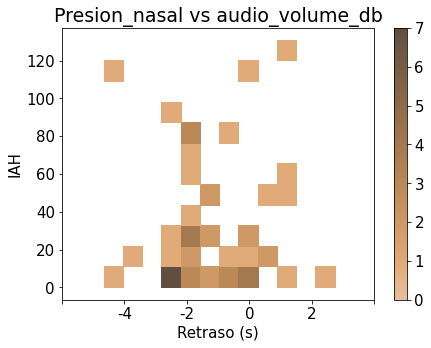

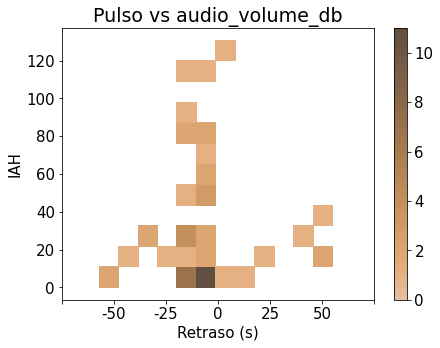

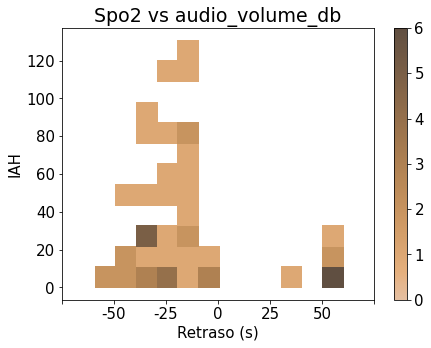

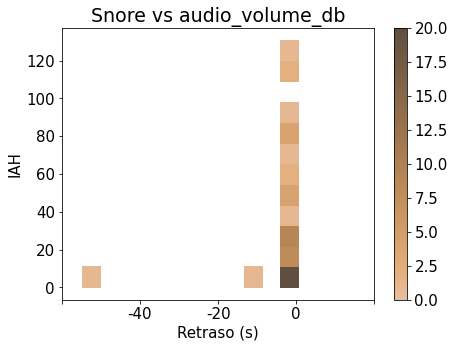

In [104]:
for descripcion in key_values - {'signal-vs-spo2-prior=60s-post=10s'}:
#for descripcion in {'signal-vs-spo2-prior=60s-post=10s'}:
    # señal con las que se ha calculado el retraso
    signal = descripcion.split('-')[2]
    correlation = preparar_grafico_histograma(descripcion=descripcion, metric="peak_corr")
    retraso = preparar_grafico_histograma(descripcion=descripcion, metric="offset_peak_corr")
    plot_informacion_histograma(correlation, main_signal=signal, metric="peak_corr", savefig=True)
    plot_informacion_histograma(retraso, main_signal=signal, metric="offset_peak_corr", savefig=True)

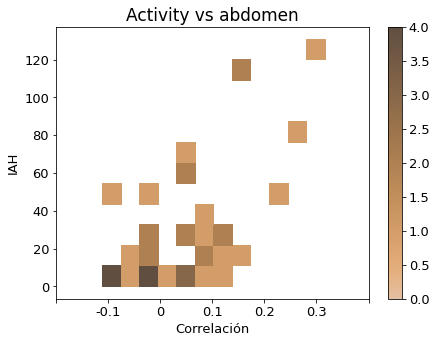

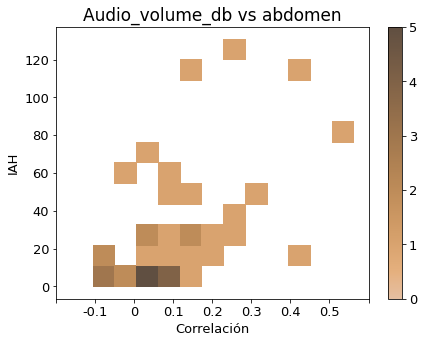

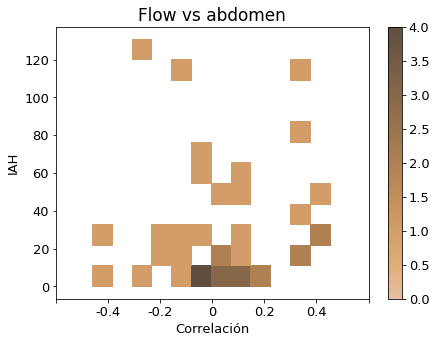

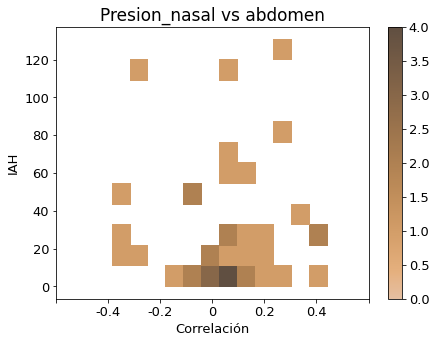

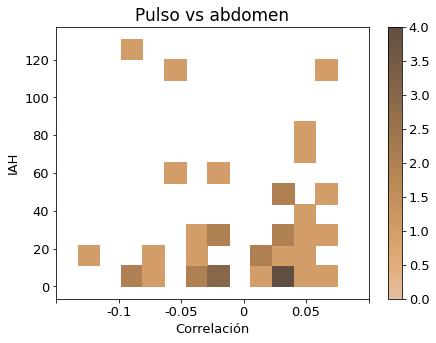

...

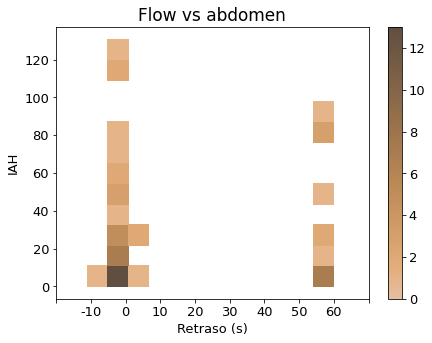

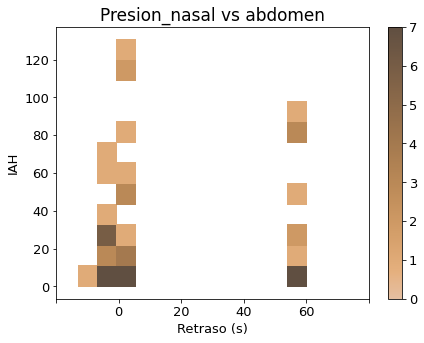

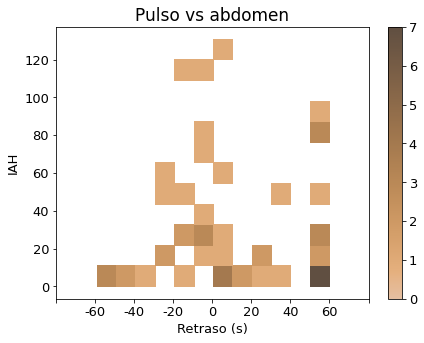

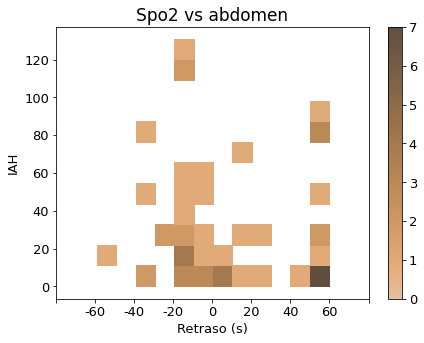

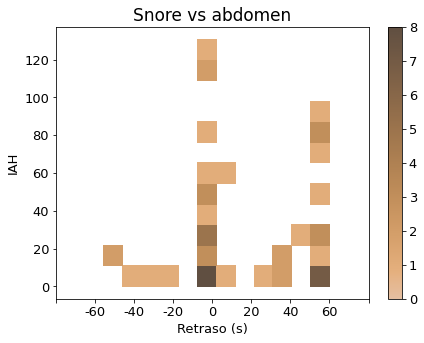

In [83]:
for descripcion in key_values - {'signal-vs-spo2-prior=60s-post=10s'}:
#for descripcion in {'signal-vs-spo2-prior=60s-post=10s'}:
    # señal con las que se ha calculado el retraso
    signal = descripcion.split('-')[2]
    correlation = preparar_grafico_histograma(descripcion=descripcion, metric="peak_corr")
    retraso = preparar_grafico_histograma(descripcion=descripcion, metric="offset_peak_corr")
    plot_informacion_histograma(correlation, main_signal=signal, metric="peak_corr", savefig=True)
    plot_informacion_histograma(retraso, main_signal=signal, metric="offset_peak_corr", savefig=True)
    break

In [13]:
iah_vs_spo2_corr = preparar_grafico_histograma(metric="peak_corr")
iah_vs_spo2_offset = preparar_grafico_histograma(metric="offset_peak_corr")

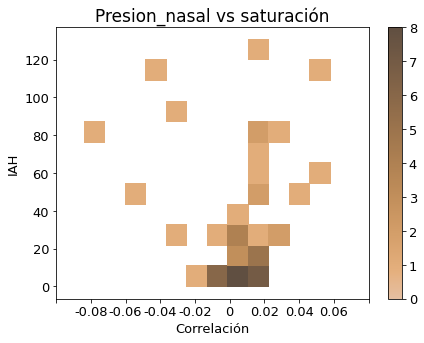

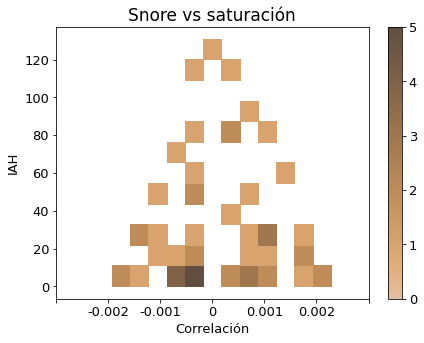

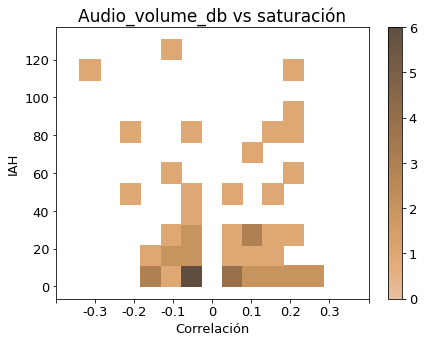

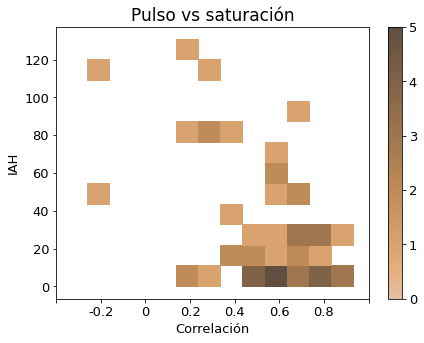

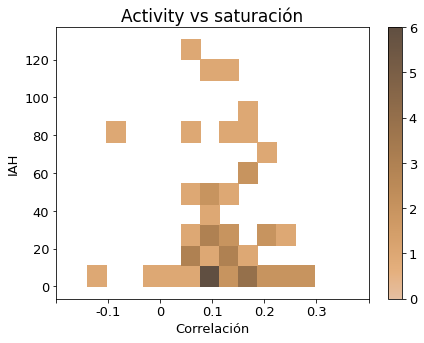

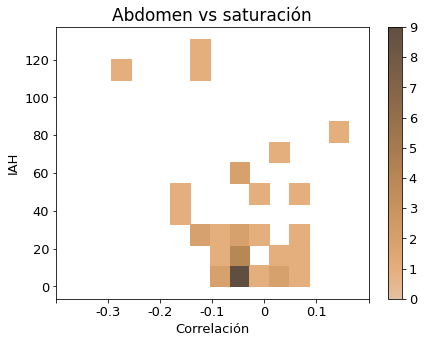

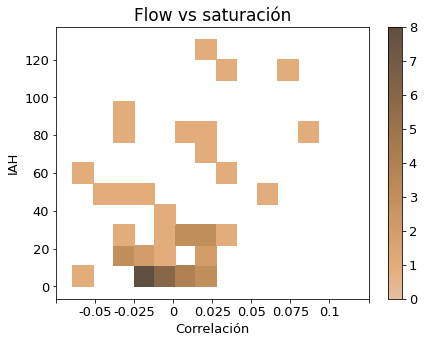

In [65]:
plot_informacion_histograma(iah_vs_spo2_corr, metric="peak_corr", savefig=True)

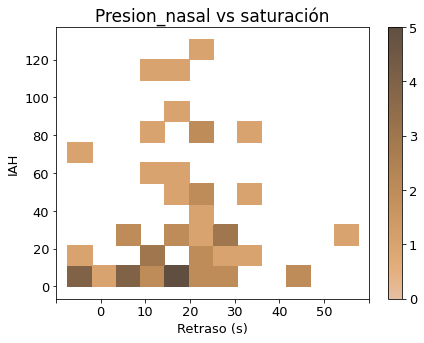

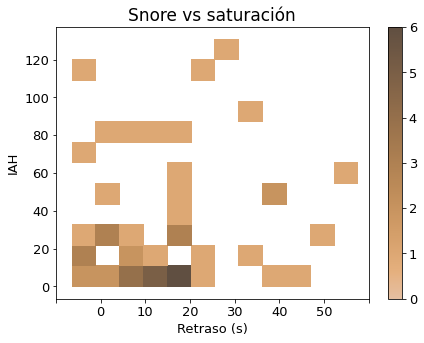

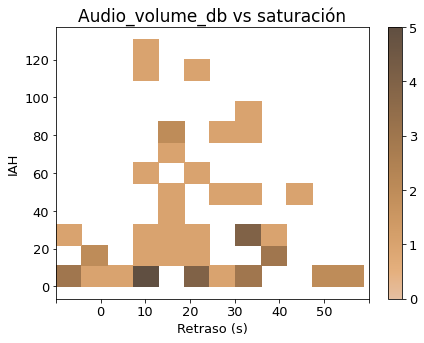

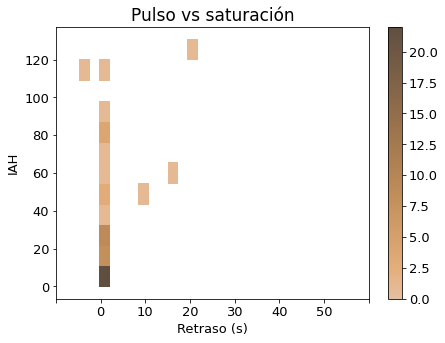

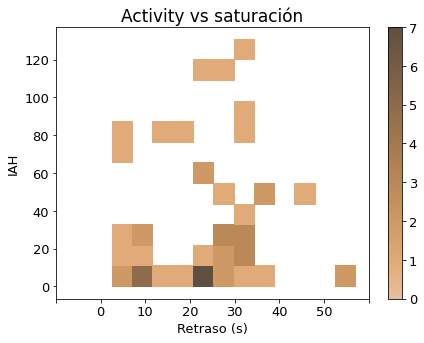

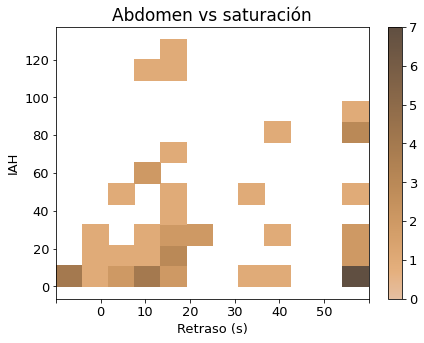

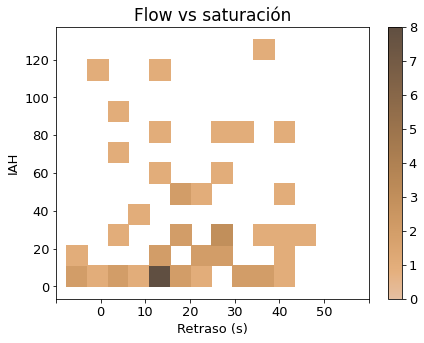

In [64]:
plot_informacion_histograma(iah_vs_spo2_offset, main_signal="spo2" metric="offset_peak_corr", xlim=(-10, 60), savefig=True)

In [16]:
for f in sorted(os.listdir()):
    if ".pdf" in f:
        print(f'retrasos/{f.split(".")[0]}')

retrasos/coeficiente_correlacion_vs_spo2
retrasos/correlacion_pulso_vs_saturacion_IAH
retrasos/retraso_señal_(segundos)_vs_spo2


Quiero ver si la evolución temporal del retraso se comporta de forma similar para cada uno de los pacientes.

In [18]:
senial_estudiada = "pulse"
key = "signal-vs-spo2-prior=60s-post=10s"

for paciente in pacientes_sorted[:10]:
    time_step = paciente.time_step
    seconds_prior, seconds_post = [int(i.replace("s", "")) for i in re.findall("\d+s", key)]
    target = key.split('-')[2]
    rs_dict = paciente.sincronizacion_señales[key]["rs"]
    rs = rs_dict["abdomen"]
    lag_list = list(range(-int(seconds_prior/time_step),int(seconds_post/time_step+1)))
    patient_manager.plot_sincronizacion_temporal_simple(rs=rs, lag_list=lag_list, column1=senial_estudiada, column2=target, time_step=time_step, seconds_prior=seconds_prior, seconds_post=seconds_post, savefig=True)

NameError: name 're' is not defined